In [1]:
import numpy as np
import pyslise as ps

In [9]:
p2d = ps.PySE2d(lambda x, y: (1+x^2)*(1+y^2), -5.5,5.5, -5.5,5.5,
                x_count=30, y_count=32, in_sector_count=5, N=12, grid_points=120)

In [10]:
s = .05
eigenvalues = []
for a in [3.18, 5.5,7.52,8.,8.42, 9.9]:
    try:
        E = find_root(lambda E: p2d.calculateError(E, ps.PySE2d.NEWTON_RAPHSON_SORTER)[0], a, a+s)
        eigenvalues.append(E)
        print(E)
    except:
        print("In [{}, {}] are no roots".format(a, a+s))

3.19591795294
5.5267435535
7.55780480385
8.03127003872
8.44458056304
9.9280622801


In [29]:
def linspace(a, b, n):
    return a + (b-a)*np.arange(0, n+1, dtype="float")/n

def expand(f):
    return lambda d: f(*d)

def calcError(E):
    return p2d.calculateErrors(E, p2d.ABS_SORTER)

n = 50000
import multiprocessing
pool = multiprocessing.Pool()
Es = linspace(3,12.5, n)
err, derr = zip(*map(expand(zip),
                     pool.map(calcError, Es)))

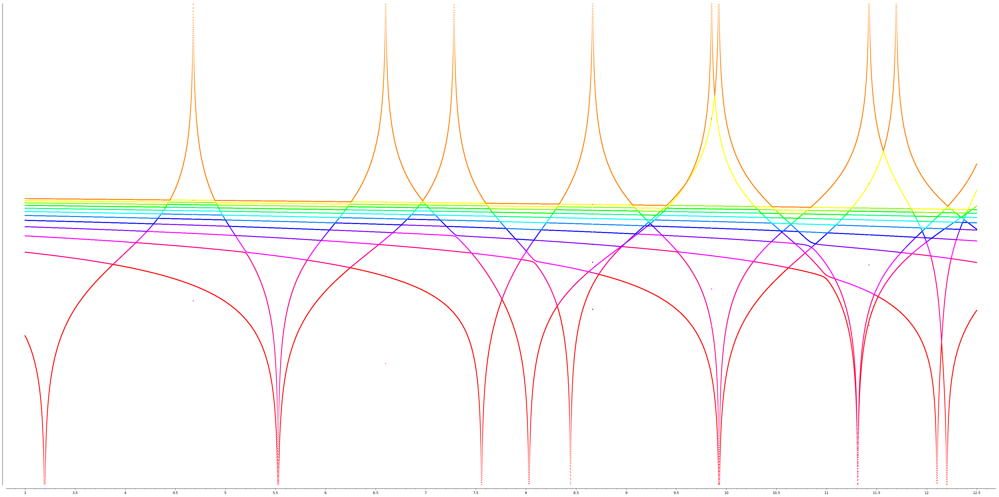

In [30]:
graph = (sum(
    list_plot_semilogy(zip(Es, map(abs, errs)), size=5, color=hue(-i/12))
    for i, errs in enumerate(zip(*err))
))
graph.show(ticks=[.5, [0]], ymax=10^3, ymin=10^-2, figsize=[40,20])

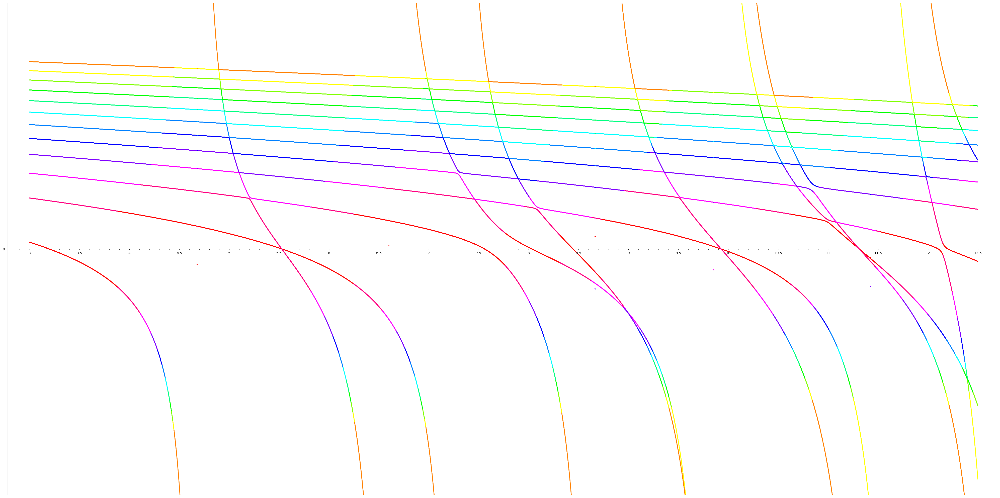

In [31]:
graph = (sum(
    list_plot(zip(Es, errs), size=5, color=hue(-i/12))
    for i, errs in enumerate(zip(*err))
))
graph.show(ticks=[.5, [0]], ymin=-12, ymax=12, figsize=[40,20])

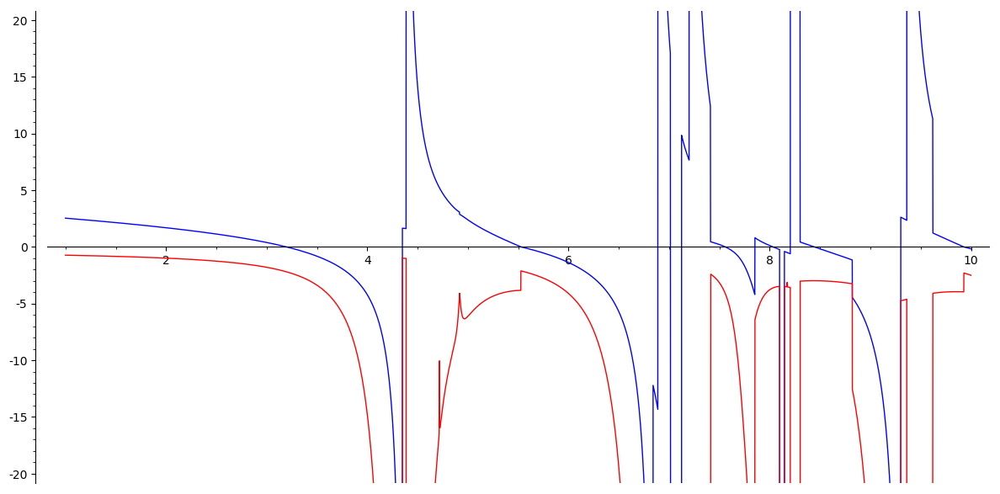

In [43]:
(plot(lambda E: p2d.calculateError(E)[0], (1,10))
+plot(lambda E: p2d.calculateError(E)[1], (1,10), color="red")
).show(figsize=[12,6], ymin=-20, ymax=20)

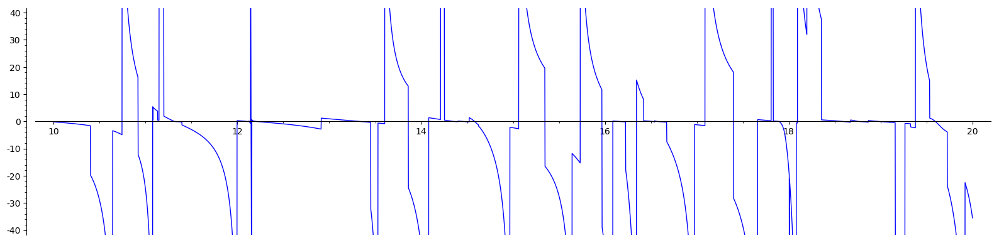

In [44]:
plot(lambda E: p2d.calculateError(E)[0], (10, 20), ymin=-40, ymax=40, figsize=[16,4])

In [ ]:
def sm_eig(m):
    return min((abs(e), e) for e in matrix(m).eigenvalues())[1]
def detm(m):
    return det(matrix(m))

In [ ]:
m = matrix(p2d.calculateErrorMatrix(12.120382)[0])
print sm_eig(m)
sorted(m.eigenvalues())

In [ ]:
m = matrix(p2d.calculateErrorMatrix(12.120383)[0])
print sm_eig(m)
sorted(m.eigenvalues())
m.condition()

In [ ]:
plot(lambda E: sm_eig(matrix(p2d.calculateErrorMatrix(E)[0])), (12.120382, 12.1203824))

In [ ]:
dx = 0.05
xs = [1, 1+dx .. 12]
err, derr = zip(*map(p2d.calculateError, xs))

In [ ]:
(list_plot(zip(xs, err), plotjoined=True)
+ list_plot(zip(xs, derr), color="red", plotjoined=True)
+ list_plot(zip(xs[1:], map(lambda u: u/dx, differences(err))), color="green", ymax= 5, ymin=-5))

In [4]:
s = .06
for a in [3.18, 5.5,7.52,8.,8.42, 9.9]:
    try:
        print(find_root(lambda E: p2d.calculateError(E)[0], a, a+s))
    except:
        print("In [{}, {}] are no roots".format(a, a+s))

3.19583746578
5.52725337367
7.55929308577
8.03016004595
8.44519002904
9.9245826814


In [46]:
E_approx = 5.5
E = find_root(lambda E: p2d.calculateError(E)[0], E_approx, E_approx+s)

xs = [-3, -2.9 .. 3]
ys = [-3, -2.9 .. 3]
fs = p2d.computeEigenfunction(E, xs, ys)
fs = map(lambda f: f/np.max(np.abs(f)), fs)

g = []
for i, f in enumerate(fs):
    g.append(list_plot3d([(x, y, z+(1-len(fs)+2*i)) for x, row in zip(xs, f) for y, z in zip(ys, row)]))
sum(g).show(viewer="threejs")

Graphics3d Object

In [53]:
len(fs)

1

In [23]:
len([a for a in fs[0]])

51

In [10]:
from jupyter_core.paths import jupyter_config_dir
jupyter_dir = jupyter_config_dir()
jupyter_dir

'/home/toon/.sage//jupyter-4.1'

In [31]:
spec.use_local_threejs()

In [32]:
spec.nbextensions_dir

'/opt/sage/local/share/jupyter/nbextensions'

In [35]:
have_prerequisites(True)

True